## Step 2: Run visibility fit by forward-modeling with RADMC-3D (ray tracing) and GALARIO (for FFT) through emcee package

Review what the belt looks like, and use it to inform the choice of parameters and the setup for the fit. <br> Start this script in the target's main directory (workingdir+'/'+sourcetag) from Step 1.

In [1]:
import numpy as np
import pickle
import os
import sys

#Start from target's main directory from Step 1
os.chdir('/Users/jonty/mydata/stirred_discs/hd16743_freeh')

#Read in directories as defined in step 1
miaopath, casapath, sourcetag, workingdir, vis, nvis = pickle.load(open('./dirvises.npy','rb'))
os.chdir('./imaging')

Open CASA viewer to display the belt, and keep it open inform your choice of parameters below.


In [2]:
%%script bash -s "$casapath" --bg
$1/casaviewer

Define a few FIXED parameters for the fit

In [16]:
Lstar=4.955  #Stellar luminosity, in Solar luminosities, for blackbody temperature calculation
dist=57.807  #distance to the star, in pc
imsize=16.0     #size (diameter) of the image you want to calculate the radiative transfer over, in arcsec.
#Make sure it includes all emission from the disk, but be wary of making it too large as ray-tracing becomes too expensive

1.10.1
1.23.5
3.0.0


Define disk starting parameters, and priors. This is for a belt with radially Gaussian surface density distribution,
and vertically Gaussian number density distribution, e.g. Matra et al. 2019b, Sect. 4.2, and Eq. 1. <br>
$$ \rho=\Sigma_0\ e^{-\frac{(r-r_{\rm c})^2}{2\sigma^2}}\frac{e^{-\frac{z^2}{2(hr)^2}}}{\sqrt{2\pi}hr} $$<br>
*Note that rho_0 in Eq. of the paper should really be in surface density units, so should have been represented as a Sigma_0 in the paper.* <br>
*Also note this is NOT the same as a belt with a radial density, rather than surface density, distribution, in which the sqrt{2pi}hr normalization would not be present*

In [4]:
#Flux scaling
fluxdensity=1.3e-3 #Total flux density of the belt, in Jy
fluxdensity_dwn, fluxdensity_up = [0.1e-3, 50e-3] #Lower and upper bounds on its prior

#Radial parameters
rmid=150.0/dist # Radial peak location of Gaussian surface density, arcsec
rmid_dwn, rmid_up = [0.3, 3.0]
sigma=32.0/2.35/dist #standard deviation of radial Gaussian surface density
sigma_dwn, sigma_up = [0.05, 'halfrmid'] #halfrmid is special setup that enables the maximum sigma to be half whatever 
#rmid is in current model evaluation.

#Vertical parameters
useh=True  #Do you want to leave the vertical aspect ratio as a free parameter? Only worth it for belts that you 
#believe have a chance to be vertically resolved
if useh:
    h=0.05 #aspect ratio of belt, constant with radius according to the equation above.
    h_dwn, h_up = [0.005, 0.2]
else:
    h=0.03

#Geometry parameters
incl=80.0 #inclination, degrees from face-on
incl_dwn, incl_up = [0.1, 89.99]
posang=170.0 #position angle, East of North. **Needs to be between 0 and 180 degrees!**
#Here below set priors in a way that your position angle is not at the edge of the prior distribution. 
#No need to modify these priors.
if posang<45.0 or posang>135.0:
    posang_dwn, posang_up = [-90.0, 90.0]
    if posang>135.0:
        posang-=180.0
else:
    posang_dwn, posang_up = [0.0, 180.0]
    
#Add star if wanted/needed. This will be located at the geometrical center of the belt.
star=True
if star:
    fstar=1e-5 #star's flux density, in Jy
    fstar_dwn, fstar_up = [1e-6, 2e-3]

Define dataset-dependent parameters: the offsets of the (star+)belt system from the phase center of the observation (dRA and dDec), and the weight factor by which to multiply all visibility weights of each dataset. <br>
The latter is necessary to ensure the measurement uncertainty on each visibility is correct, and therefore that the uncertainties derived on the parameters of the fit are correct. This is not very expensive to do as the values of these weight factors converge very quickly.

In [5]:
if nvis>1: 
    #If you have more than one visibility dataset to fit, define lists - rather than values - of starting 
    #parameters and priors
    dRA=[-0.07,0.1,0.1] #RA offset of star+disk from phase center of observations. 
    ###Remember, RA is positive to the right in the CASA viewer image!###
    dRA_dwn=[-3.0,-3.0,-3.0]
    dRA_up=[3.0,3.0,3.0]
    dDec=[0.14,-0.1,-0.1] #Dec offset of star+disk from phase center of observations
    dDec_dwn=[-3.0,-3.0,-3.0]
    dDec_up=[3.0,3.0,3.0]
    wtfact=[0.289,0.289,1e-4] #factors by which incorrect weights should be multiplied by.
    #This is typically a value between 0.2 and 0.8 for later ALMA Cycles (>~3, but depends on the CASA version used for
    #reduction), around 1 (i.e. weights should be correct) for SMA data. For early ALMA Cycles, this factor comes out 
    #very low, something between 1e-5 and a few times 1e-4 (i.e. weights are largely overestimated by CASA).
    wtfact_dwn=[1e-6,1e-6,1e-6]
    wtfact_up=[10.0,10.0,10.0]
else:
    dRA=[-0.07] #RA offset of star+disk from phase center of observations
    dRA_dwn=[-3.0]
    dRA_up=[3.0]
    dDec=[0.14] #Dec offset of star+disk from phase center of observations
    dDec_dwn=[-3.0]
    dDec_up=[3.0]
    wtfact=[0.289] #factors by which incorrect weights should be multiplied by
    wtfact_dwn=[1e-6]
    wtfact_up=[10.0]
#This below should be set to False if no weight factor is to be applied. Not fully tested as 'False',
# but in general you should always want to check your visiblity weights, so leave as True.
want_wtfact=True

Here below add background sources (galaxies?) that happen to lie in the field and can affect the modelling. <br>
There can be more than 1, and these can be point sources or resolved. If you deem them to be resolved, set resolved=True and model them as a simple inclined 2D Gaussian. <br>
Note that the number of parameters quickly increases if you have many resolved galaxies! Which will slow down your fit.

In [7]:
ngal=0 #Number of galaxies in the field to be modelled.
if ngal>=1:
    resolved=[True, False, False] # if deemed resolved, use 2D Gaussian as galaxy model (6 free parameters), and set 
    #resolved=True for that galaxy. 
    #Otherwise, use point source (3 free parameters) by setting resolved=False.
    fbkg=[285e-6,500e-6,500e-6] #Total flux density of galaxy (galaxies) (Jy)
    fbkg_dwn=[1e-6,1e-6,1e-6]
    fbkg_up=[10e-3,10e-3,10e-3]
    dRAbkg=[2.97,2.97,2.97] # RA offset of galaxy (galaxies) from center of star+disk system. Note that this WILL NOT
    #account for proper motion of the star+disk between datasets taken at different times, 
    #since the offset is fixed for all datasets.
    dRAbkg_dwn=[x-3.0 for x in dRAbkg]
    dRAbkg_up=[x+3.0 for x in dRAbkg]
    dDecbkg=[1.81,1.81,1.81] # Dec offset of galaxy (galaxies) from center of star+disk system. Note that this WILL NOT
    #account for proper motion of the star+disk between datasets taken at different times, 
    #since the offset is fixed for all datasets.
    dDecbkg_dwn=[x-3.0 for x in dDecbkg]
    dDecbkg_up=[x+3.0 for x in dDecbkg]
    sigmagal=[0.3,0,0] # standard deviation (arcsec) of Gaussian used to describe the bkg source
    sigmagal_dwn=[0.05,0.05,0.05]
    sigmagal_up=[1.0,1.0,1.0]
    PAgal=[28.0,0,0] # PA (deg), East of North. **Needs to be between 0 and 180 degrees!**
    #Set prior bounds on PA in a smart way, as done for the disk.
    PAgal_dwn=[]
    PAgal_up=[]
    for i in PAgal:
        if i<45.0 or i>135.0:
            PAgal_dwn.append(-90.0)
            PAgal_up.append(90.0)
        else:
            PAgal_dwn.append(0.0)
            PAgal_up.append(180.0)   
    incgal=[49.0,0,0] # inclination of the bkg source from face-on (degrees)
    incgal_dwn=[0.1,0.1,0.1]
    incgal_up=[89.99,89.99,89.99]
else: 
    resolved=None
    fbkg=None
    dRAbkg=None
    dDecbkg=None
    sigmagal=None
    PAgal=None
    incgal=None

Create needed folders for fitting, check that the imaging has been carried out as we need the primary beam for fitting.

In [8]:
if not os.path.exists(workingdir+'/'+sourcetag+'/imaging'):
    sys.exit('Carry out imaging first: need .pb primary beam image')
for i in ['uvfit']:
    if not os.path.exists(workingdir+'/'+sourcetag+'/'+i):
        os.mkdir(workingdir+'/'+sourcetag+'/'+i)
!cp -r {miaopath}/utils/setup_mcmc.py {workingdir}/{sourcetag}/uvfit/. 
!cp -r {miaopath}/utils/problem_setup_cont_gauss.py {workingdir}/{sourcetag}/uvfit/.  
!cp -r {miaopath}/utils/dustkappa_10445.micr.inp {workingdir}/{sourcetag}/uvfit/. 

Now dump (pickle) array containing all initial fit parameters, as defined above.

NB DO NOT MODIFY ORDER AS OTHERWISE FITTING CODE WILL NOT RECOGNISE PARAMETERS CORRECTLY!

In [9]:
os.chdir(workingdir+'/'+sourcetag+'/uvfit')

pars_init=[fluxdensity, rmid, sigma, incl, posang]
labelparams=[r"$F_{\nu_{\rm belt}}$ (Jy)", r"$R$ ('')", r"$\sigma R$ ('')", r"$i$ ($^{o}$)", r"PA ($^{o}$)"]
labels=['fnu', 'r', 'sigr', 'i', 'pa']
priors_dwn=[fluxdensity_dwn, rmid_dwn, sigma_dwn, incl_dwn, posang_dwn]
priors_up=[fluxdensity_up, rmid_up, sigma_up, incl_up, posang_up]
if useh:
    pars_init.append(h)
    labelparams.append(r'$h$')
    labels.append('h')
    priors_dwn.append(h_dwn)
    priors_up.append(h_up)
if star:
    pars_init.append(fstar)
    labelparams.append(r'$F_{\nu_{\ast}}$ (Jy)')
    labels.append('fnustar')
    priors_dwn.append(fstar_dwn)
    priors_up.append(fstar_up)
for i in np.arange(nvis):
    pars_init.append(dRA[i])
    labelparams.append(r"$\Delta$RA$_"+str(i)+"$ ('')")
    labels.append('deltara_'+str(i))
    priors_dwn.append(dRA_dwn[i])
    priors_up.append(dRA_up[i])
    pars_init.append(dDec[i])
    labelparams.append(r"$\Delta$Dec$_"+str(i)+"$ ('')")
    labels.append('deltadec_'+str(i))
    priors_dwn.append(dDec_dwn[i])
    priors_up.append(dDec_up[i])
    if want_wtfact:
        pars_init.append(wtfact[i])
        labelparams.append(r"w$_"+str(i)+"$")
        labels.append('w_'+str(i))
        priors_dwn.append(wtfact_dwn[i])
        priors_up.append(wtfact_up[i])
if ngal>=1:
    for i in np.arange(ngal):
        pars_init.append(fbkg[i])
        labelparams.append(r"$F_{\rm bkg"+str(i)+"}$ (mJy)")
        labels.append('fbkg_'+str(i))
        priors_dwn.append(fbkg_dwn[i])
        priors_up.append(fbkg_up[i])
        pars_init.append(dRAbkg[i])
        labelparams.append(r"$\Delta$RA$_{\rm bkg"+str(i)+"}$ ('')")
        labels.append('deltarabkg_'+str(i))
        priors_dwn.append(dRAbkg_dwn[i])
        priors_up.append(dRAbkg_up[i])
        pars_init.append(dDecbkg[i])
        labelparams.append(r"$\Delta$Dec$_{\rm bkg"+str(i)+"}$ ('')")
        labels.append('deltadecbkg_'+str(i))
        priors_dwn.append(dDecbkg_dwn[i])
        priors_up.append(dDecbkg_up[i])
        if resolved[i]:
            pars_init.append(sigmagal[i])
            labelparams.append(r"$\sigma_{\rm bkg"+str(i)+"}$ ('')")
            labels.append('sigmabkg_'+str(i))
            priors_dwn.append(sigmagal_dwn[i])
            priors_up.append(sigmagal_up[i])
            pars_init.append(PAgal[i])
            labelparams.append(r"$PA_{\rm bkg"+str(i)+"}$ ($^{o}$)")
            labels.append('pabkg_'+str(i))
            priors_dwn.append(PAgal_dwn[i])
            priors_up.append(PAgal_up[i])
            pars_init.append(incgal[i])
            labelparams.append(r"$i_{\rm bkg"+str(i)+"}$ ($^{o}$)")
            labels.append('ibkg_'+str(i))
            priors_dwn.append(incgal_dwn[i])
            priors_up.append(incgal_up[i])
pickle.dump([Lstar, dist, imsize, useh, star, want_wtfact, nvis, ngal, resolved, pars_init, labels, labelparams, priors_dwn, priors_up], open('parsandpriors.npy', 'wb'), protocol=2)            

Set up model (including ray-tracing with RADMC-3D, and visibility computation with galario) and MCMC run through emcee. The run will be saved at every step at the backend 
address specified. <br>
**IMPORTANT**: setting newbackend to True overwrites existing backend at the given name. If you care about a given MCMC 
that has taken you a long time to run, make sure you do NOT overwrite this backend! <br>
If you set newbackend to False, the MCMC will
continue from its last step. This is what you want to do if you decided to stop the MCMC while it was running, and you 
want to continue it (see further steps below).

In [10]:
#Decide whether you want to overwrite backend (newbackend=True), or continue from existing backend.
newbackend=True
backendaddress='backend_'+sourcetag+'_todaysdate_computersname_v4.pkl'
pickle.dump([newbackend, backendaddress], open('backendoptions.npy', 'wb'), protocol=2)

#Insert radial minimum, maximum, and number of radial points of model grid, where minimum has an internal check preventing it from being less than 1 AU (somewhat arbitrary)
#and max not to be more than half the model image size (imsize/2 above).
#Rule of thumb is to have dr=(rmax-rmin)/nr being less than or comparable to the model pixel size (itself determined from the longest baseline in the imaging tutorial), and small enough to reasonably cover the model disk width.
rmin_arcsec=0.01#rmid-5.*sigma
rmax_arcsec=8.0
nr=100
pickle.dump([rmin_arcsec, rmax_arcsec, nr], open('gridparams.npy', 'wb'), protocol=2)
# IF the code throws warnings during MCMC, make the radial size of model grid wider accordingly.

%run setup_mcmc

Radial grid of model goes from 1.0 au to 462.456 au, with 100 radial steps, and step size of 0.07982701056965419 arcsec
Setting up sampler...


And now run MCMC for whichever number of steps (nsteps) you like. <br>
A progress bar will come up if you have installed the tqdm package. If tired of waiting at any point, you can kill it by interrupting the notebook's kernel. The current state of the sampler will be saved within the backend and can be recovered.

In [11]:
nsteps=1000
sampler.run_mcmc(pos,nsteps,progress=True)

/Users/jonty/anaconda3/lib/python3.10/site-packages/emcee/ensemble.py:255: RuntimeWarning: Initial state is not linearly independent and it will not allow a full exploration of parameter space
  warnings.warn(
  0%|                                                  | 0/1000 [00:00<?, ?it/s]/Users/jonty/anaconda3/lib/python3.10/site-packages/emcee/moves/red_blue.py:97: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
  2%|▋                                      | 19/1000 [02:17<2:03:54,  7.58s/it]

Radial grid of model goes from 1.0 au to 462.456 au, with 100 radial steps, and step size of 0.07982701056965419 arcsec
Setting up sampler...
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd810> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd810>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd780> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd810> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd810>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd780> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd750> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd780> <radmc3dPy.image.r

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd7b0> Radial grid of model goes from 1.0 au to 462.456 au, with 100 radial steps, and step size of 0.07982701056965419 arcsec
Setting up sampler...
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1810> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1810>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1780> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1780>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1810> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1810>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1780> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1780>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1810> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1810>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1750> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1750>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1810> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1810>
<radmc3dPy.image.r

<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1540> Radial grid of model goes from 1.0 au to 462.456 au, with 100 radial steps, and step size of 0.07982701056965419 arcsec
Setting up sampler...
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd810> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd810>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.r

  2%|▊                                      | 20/1000 [02:24<2:01:29,  7.44s/it]

Radial grid of model goes from 1.0 au to 462.456 au, with 100 radial steps, and step size of 0.07982701056965419 arcsec
Setting up sampler...
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d810> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d810>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d780> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d780>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d810> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d810>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d780> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d780>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d810> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d810>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d540> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d540>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d810> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d810>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d540> <radmc3dPy.image.r

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0> Radial grid of model goes from 1.0 au to 462.456 au, with 100 radial steps, and step size of 0.07982701056965419 arcsec
Setting up sampler...
<radmc3dPy.image.radmc3dImage object at 0x7f9594649810> <radmc3dPy.image.radmc3dImage object at 0x7f9594649810>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946497b0> <radmc3dPy.image.radmc3dImage object at 0x7f95946497b0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946497b0> <radmc3dPy.image.radmc3dImage object at 0x7f95946497b0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946497b0> <radmc3dPy.image.radmc3dImage object at 0x7f95946497b0>
<radmc3dPy.image.r

<radmc3dPy.image.radmc3dImage object at 0x7f9594649750> Radial grid of model goes from 1.0 au to 462.456 au, with 100 radial steps, and step size of 0.07982701056965419 arcsec
Setting up sampler...
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd810> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd810>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd810> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd810>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd810> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd810>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd540> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd540>
<radmc3dPy.image.r

  3%|█▏                                     | 31/1000 [03:52<2:07:19,  7.88s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd780> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd750> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd750> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd750> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd750> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fbe10

  3%|█▏                                     | 32/1000 [04:00<2:10:08,  8.07s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd780> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd780>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd780> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd780>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd810> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd810>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd810> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd810>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd810> <radmc3dPy.image.radmc3dImage object at 0x7fc8a6

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d780>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d810> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d810>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d780> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d780>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d810> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d810>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d780> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d780>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d810> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d810>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d780> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d780>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d810> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d810>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cf

<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d840> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd750> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd750> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd750> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd903

<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1540>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d17b0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d17b0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1540> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1540>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1780> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1780>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1540> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1540>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1780> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1780>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1540> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1540>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1780> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1780>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d17b0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1840> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd780> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd780>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd780> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd780>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750> <radmc3dPy.image.radmc3dImage object at 0x7fe618

  4%|█▋                                     | 43/1000 [05:33<2:18:04,  8.66s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd780> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd750> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd780> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd750> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd780> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd750> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd780> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd750> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd780> <radmc3dPy.image.radmc3dImage object at 0x7fbe10

  4%|█▋                                     | 44/1000 [05:42<2:22:05,  8.92s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd780> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd780>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd780> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd780>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd780> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd780>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd780> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd780>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd780> <radmc3dPy.image.radmc3dImage object at 0x7fc8a6

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d840>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d780> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d780>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d840> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d840>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d780> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d780>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d840> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d840>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d780> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d780>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d840> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d840>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d780> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d780>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d840> <radmc3dPy.image.radmc3dImage object at 0x7fb0cf

<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d840> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1840>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1540> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1540>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1840> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1840>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1540> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1540>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1840> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1840>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1540> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1540>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1840> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1840>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1780> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1780>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1840> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1540> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd840> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd840> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd840> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd840> <radmc3dPy.image.radmc3dImage object at 0x7fe618

  4%|█▊                                     | 45/1000 [05:52<2:26:50,  9.23s/it]

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd840> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd840>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd840> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd840>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd840> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd840>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd840> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd840>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd840> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd840> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd840> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd840> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd840> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fd903

<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd750> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946497b0> <radmc3dPy.image.radmc3dImage object at 0x7f95946497b0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946497b0> <radmc3dPy.image.radmc3dImage object at 0x7f95946497b0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946497b0> <radmc3dPy.image.radmc3dImage object at 0x7f95946497b0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946497b0> <radmc3dPy.image.radmc3dImage object at 0x7f95946497b0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594

  6%|██▏                                    | 56/1000 [07:28<2:16:33,  8.68s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd750> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd750> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd750> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd750> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840> <radmc3dPy.image.radmc3dImage object at 0x7fbe10

  6%|██▏                                    | 57/1000 [07:37<2:18:07,  8.79s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d840> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d840>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d840> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d840>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d840> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d840>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d840> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d840>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cf

<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d840> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd840> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd840>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd840> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd840>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd840> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd840>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd840> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd840>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a6

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd840> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd840> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd840> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd840> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd840> <radmc3dPy.image.radmc3dImage object at 0x7fe618

<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd840> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1540>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1780> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1780>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1540> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1540>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1780> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1780>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1540> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1540>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1780> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1780>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1540> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1540>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1780> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1780>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1540> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1540> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946497b0> <radmc3dPy.image.radmc3dImage object at 0x7f95946497b0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946497b0> <radmc3dPy.image.radmc3dImage object at 0x7f95946497b0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946497b0> <radmc3dPy.image.radmc3dImage object at 0x7f95946497b0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946497b0> <radmc3dPy.image.radmc3dImage object at 0x7f95946497b0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594

<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd840> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd840>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd840> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd840> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd750> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd840> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd750> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd840> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd750> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd840> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd750> <radmc3dPy.image.radmc3dImage object at 0x7fd903

  7%|██▋                                    | 69/1000 [09:18<2:08:09,  8.26s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd780> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd780>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd840> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd840>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd780> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd780>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd840> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd840>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd780> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd780>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd840> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd840>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd780> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd780>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd840> <radmc3dPy.image.radmc3dImage object at 0x7fc8a6

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd840> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd750> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd750> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd750> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd750> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840> <radmc3dPy.image.radmc3dImage object at 0x7fbe10

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd750> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649840> <radmc3dPy.image.radmc3dImage object at 0x7f9594649840>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649840> <radmc3dPy.image.radmc3dImage object at 0x7f9594649840>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649840> <radmc3dPy.image.radmc3dImage object at 0x7f9594649840>
<radmc3dPy.image.radmc3dImage object at 0x7f95946497b0> <radmc3dPy.image.radmc3dImage object at 0x7f95946497b0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649840> <radmc3dPy.image.radmc3dImage object at 0x7f9594649840>
<radmc3dPy.image.radmc3dImage object at 0x7f95946497b0> <radmc3dPy.image.radmc3dImage object at 0x7f9594

<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd840> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd840> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd840> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd840> <radmc3dPy.image.radmc3dImage object at 0x7fe618

<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d840> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1540>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1780> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1780>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1540> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1540>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1780> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1780>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1540> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1540>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1780> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1780>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1540> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1540>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1780> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1780>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1540> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

  7%|██▋                                    | 70/1000 [09:26<2:04:48,  8.05s/it]

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd840> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd750> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd750> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd750> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd750> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fd903

  8%|███▏                                   | 81/1000 [10:48<1:52:47,  7.36s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd750> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd750> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd750> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd750> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840> <radmc3dPy.image.radmc3dImage object at 0x7fbe10

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd750> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd840>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd780> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd780>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd840> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd840>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd780> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd780>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd840> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd840>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd780> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd780>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd840> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd840>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd780> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd780>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd840> <radmc3dPy.image.radmc3dImage object at 0x7fc8a6

  8%|███▏                                   | 82/1000 [10:56<1:53:17,  7.40s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1780> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1780>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1840> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1840>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1780> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1780>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1840> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1840>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1780> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1780>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1840> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1840>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1780> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1780>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1840> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1840>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1780> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1840> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946497b0> <radmc3dPy.image.radmc3dImage object at 0x7f95946497b0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649840> <radmc3dPy.image.radmc3dImage object at 0x7f9594649840>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946497b0> <radmc3dPy.image.radmc3dImage object at 0x7f95946497b0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946497b0> <radmc3dPy.image.radmc3dImage object at 0x7f95946497b0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594

<radmc3dPy.image.radmc3dImage object at 0x7f95946497b0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd840> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd840> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd750> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd750> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fd903

  8%|███▏                                   | 83/1000 [11:03<1:52:07,  7.34s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d840> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d840>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d840> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d840>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d780> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d780>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d840> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d840>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d780> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d780>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d840> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d840>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d780> <radmc3dPy.image.radmc3dImage object at 0x7fb0cf

  9%|███▋                                   | 94/1000 [12:26<1:50:49,  7.34s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd750> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd750> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd750> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd750> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840> <radmc3dPy.image.radmc3dImage object at 0x7fbe10

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd750> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1840>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1780> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1780>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1840> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1840>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1780> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1780>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1840> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1840>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1780> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1780>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1840> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1840>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1780> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1780>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1840> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1780> <radmc3dPy.image.radmc3dImage object at 0x7f95946497b0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649840> <radmc3dPy.image.radmc3dImage object at 0x7f9594649840>
<radmc3dPy.image.radmc3dImage object at 0x7f95946497b0> <radmc3dPy.image.radmc3dImage object at 0x7f95946497b0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649840> <radmc3dPy.image.radmc3dImage object at 0x7f9594649840>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649840> <radmc3dPy.image.radmc3dImage object at 0x7f9594649840>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649840> <radmc3dPy.image.radmc3dImage object at 0x7f9594649840>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594

 10%|███▋                                   | 95/1000 [12:33<1:51:08,  7.37s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd780> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd780>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd780> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd780>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd780> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd780>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd780> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd780>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd780> <radmc3dPy.image.radmc3dImage object at 0x7fc8a6

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd840> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd840> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd840> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd840> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750> <radmc3dPy.image.radmc3dImage object at 0x7fe618

<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd840> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

 10%|███▋                                   | 96/1000 [12:40<1:49:45,  7.28s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd840> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd750> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd840> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd750> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd840> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd750> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd840> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd750> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd840> <radmc3dPy.image.radmc3dImage object at 0x7fd903

 11%|████                                  | 106/1000 [13:57<1:54:04,  7.66s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd750> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd780> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd780> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd780> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840> <radmc3dPy.image.radmc3dImage object at 0x7fbe10

 11%|████                                  | 107/1000 [14:05<1:55:05,  7.73s/it]

<radmc3dPy.image.radmc3dImage object at 0x7f95946497b0> <radmc3dPy.image.radmc3dImage object at 0x7f95946497b0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649840> <radmc3dPy.image.radmc3dImage object at 0x7f9594649840>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649870> <radmc3dPy.image.radmc3dImage object at 0x7f9594649870>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649870> <radmc3dPy.image.radmc3dImage object at 0x7f9594649870>
<radmc3dPy.image.radmc3dImage object at 0x7f95946497b0> <radmc3dPy.image.radmc3dImage object at 0x7f95946497b0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649870> <radmc3dPy.image.radmc3dImage object at 0x7f9594649870>
<radmc3dPy.image.radmc3dImage object at 0x7f95946497b0> <radmc3dPy.image.radmc3dImage object at 0x7f95946497b0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649870> <radmc3dPy.image.radmc3dImage object at 0x7f9594

<radmc3dPy.image.radmc3dImage object at 0x7f95946497b0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1780>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1540> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1540>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1780> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1780>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1840> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1840>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1840> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1840>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1540> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd840>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd840> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd840>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

 11%|████                                  | 108/1000 [14:13<1:58:38,  7.98s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd840> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd870> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd870> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd870> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd870> <radmc3dPy.image.radmc3dImage object at 0x7fe618

<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd750> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd870> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd840> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd870> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd840> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd870> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fd903

 11%|████▏                                 | 109/1000 [14:21<1:57:34,  7.92s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d780> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d780>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d840> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d840>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d870> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d870>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d870> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d870>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d870> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d870>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d870> <radmc3dPy.image.radmc3dImage object at 0x7fb0cf

 12%|████▌                                 | 119/1000 [15:35<1:49:06,  7.43s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840> <radmc3dPy.image.radmc3dImage object at 0x7fbe10

 12%|████▌                                 | 120/1000 [15:42<1:47:12,  7.31s/it]

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1840> <radmc3dPy.image.radmc3dImage object at 0x7f95946497b0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946497b0> <radmc3dPy.image.radmc3dImage object at 0x7f95946497b0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946497b0> <radmc3dPy.image.radmc3dImage object at 0x7f95946497b0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946497b0> <radmc3dPy.image.radmc3dImage object at 0x7f95946497b0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946497b0> <radmc3dPy.image.radmc3dImage object at 0x7f9594

<radmc3dPy.image.radmc3dImage object at 0x7f9594649870> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd870>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd870> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd870>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd870> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd870>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd870> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd870>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd840> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd840>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd870> <radmc3dPy.image.radmc3dImage object at 0x7fc8a6

 12%|████▌                                 | 121/1000 [15:50<1:47:53,  7.37s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d870> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d870>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d870> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d870>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d870> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d870>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d870> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d870>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cf

<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d870> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd840> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd870> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd840> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd870> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd840> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd870> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd840> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd870> <radmc3dPy.image.radmc3dImage object at 0x7fd903

 12%|████▋                                 | 122/1000 [15:57<1:47:01,  7.31s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd870> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd870> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd870> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd870> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe618

 13%|█████                                 | 133/1000 [17:20<1:48:27,  7.51s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd780> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd780> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd780> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd780> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe10

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7f9594649870>
<radmc3dPy.image.radmc3dImage object at 0x7f95946497b0> <radmc3dPy.image.radmc3dImage object at 0x7f95946497b0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649870> <radmc3dPy.image.radmc3dImage object at 0x7f9594649870>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649870> <radmc3dPy.image.radmc3dImage object at 0x7f9594649870>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649870> <radmc3dPy.image.radmc3dImage object at 0x7f9594649870>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649870> <radmc3dPy.image.radmc3dImage object at 0x7f9594

<radmc3dPy.image.radmc3dImage object at 0x7f95946497b0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1840>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1540> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1540>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1840> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1840>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1540> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1540>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1840> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1840>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1540> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1540>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1840> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1840>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1840> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

 13%|█████                                 | 134/1000 [17:27<1:48:58,  7.55s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd870> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd870>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd840> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd840>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd870> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd870>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd840> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd840>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd870> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd870>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd840> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd840>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd870> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd870>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd840> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd840>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd870> <radmc3dPy.image.radmc3dImage object at 0x7fc8a6

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd870> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd870> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd870> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd870> <radmc3dPy.image.radmc3dImage object at 0x7fd903

 14%|█████▏                                | 135/1000 [17:34<1:46:50,  7.41s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d780> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d780>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d870> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d870>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d870> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d870>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d870> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d870>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d870> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d870>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cf

<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d870> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd870> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd870> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd870> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750> <radmc3dPy.image.radmc3dImage object at 0x7fe618

 15%|█████▌                                | 146/1000 [18:58<1:46:56,  7.51s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd780> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd780> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd780> <radmc3dPy.image.radmc3dImage object at 0x7fbe10

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd870> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd870>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd840> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd840>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd870> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd870>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd870> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd870>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd870> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd870>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd840> <radmc3dPy.image.radmc3dImage object at 0x7fc8a6

 15%|█████▌                                | 147/1000 [19:06<1:50:23,  7.76s/it]

<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946497b0> <radmc3dPy.image.radmc3dImage object at 0x7f95946497b0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946497b0> <radmc3dPy.image.radmc3dImage object at 0x7f95946497b0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946497b0> <radmc3dPy.image.radmc3dImage object at 0x7f95946497b0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946497b0> <radmc3dPy.image.radmc3dImage object at 0x7f95946497b0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594

<radmc3dPy.image.radmc3dImage object at 0x7f95946497b0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1840>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1840> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1840>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1840> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1840>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1840> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1840>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1840> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd840> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd870> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd840> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd870> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd840> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd870> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd840> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd870> <radmc3dPy.image.radmc3dImage object at 0x7fd903

 15%|█████▌                                | 148/1000 [19:14<1:51:33,  7.86s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd870> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750> <radmc3dPy.image.radmc3dImage object at 0x7fe618

 16%|██████                                | 160/1000 [20:49<1:52:38,  8.05s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd780> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd780> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd780> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd780> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd780> <radmc3dPy.image.radmc3dImage object at 0x7fbe10

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd840>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd840> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd840>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd840> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd840>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd840> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd840>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd840> <radmc3dPy.image.radmc3dImage object at 0x7fc8a6

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd840> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7f95946497b0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649870> <radmc3dPy.image.radmc3dImage object at 0x7f9594649870>
<radmc3dPy.image.radmc3dImage object at 0x7f95946497b0> <radmc3dPy.image.radmc3dImage object at 0x7f95946497b0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649870> <radmc3dPy.image.radmc3dImage object at 0x7f9594649870>
<radmc3dPy.image.radmc3dImage object at 0x7f95946497b0> <radmc3dPy.image.radmc3dImage object at 0x7f95946497b0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946497b0> <radmc3dPy.image.radmc3dImage object at 0x7f95946497b0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946497b0> <radmc3dPy.image.radmc3dImage object at 0x7f9594

 16%|██████                                | 161/1000 [20:57<1:51:32,  7.98s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1540> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1540>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1540> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1540>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1540> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1540>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1540> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1540>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1540> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1840> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd840> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd870> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd840> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd870> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd840> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd870> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd840> <radmc3dPy.image.radmc3dImage object at 0x7fd903

 16%|██████▏                               | 162/1000 [21:05<1:50:59,  7.95s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd870> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd870> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd870> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe618

 16%|██████▏                               | 163/1000 [21:12<1:50:03,  7.89s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d780> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d780>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d870> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d870>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d870> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d870>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d870> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d870>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cf

 17%|██████▌                               | 173/1000 [22:32<1:50:44,  8.03s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd780> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd780> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd840> <radmc3dPy.image.radmc3dImage object at 0x7fbe10

 17%|██████▌                               | 174/1000 [22:40<1:51:00,  8.06s/it]

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd810>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd840>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd840> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd840>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd870> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd870>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd840> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd840>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd870> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd870>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd840> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd840>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd870> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd870>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd840> <radmc3dPy.image.radmc3dImage object at 0x7fc8a6

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946497b0> <radmc3dPy.image.radmc3dImage object at 0x7f95946497b0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649870> <radmc3dPy.image.radmc3dImage object at 0x7f9594649870>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649870> <radmc3dPy.image.radmc3dImage object at 0x7f9594649870>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649870> <radmc3dPy.image.radmc3dImage object at 0x7f9594649870>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946497b0> <radmc3dPy.image.radmc3dImage object at 0x7f9594

 18%|██████▋                               | 175/1000 [22:48<1:48:57,  7.92s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1540> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1540>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1840> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1840>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1540> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1540>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1840> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1840>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1540> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1540>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1840> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1840>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1540> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1540>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1840> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1840>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1540> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd870> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd870> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd870> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd840> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd840>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd870> <radmc3dPy.image.radmc3dImage object at 0x7fd903

<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd750> <radmc3dPy.image.radmc3dImage object at 0x7fe618

 18%|██████▋                               | 176/1000 [22:56<1:47:19,  7.81s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d780> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d780>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d780> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d780>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d780> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d780>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d780> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d780>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d780> <radmc3dPy.image.radmc3dImage object at 0x7fb0cf

 19%|███████                               | 187/1000 [24:27<1:51:32,  8.23s/it]

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe10

 19%|███████▏                              | 188/1000 [24:35<1:51:46,  8.26s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a6

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594

<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

 19%|███████▏                              | 189/1000 [24:43<1:53:12,  8.38s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd903

 19%|███████▏                              | 190/1000 [24:52<1:53:21,  8.40s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe618

<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cf

 20%|███████▋                              | 201/1000 [26:24<1:53:22,  8.51s/it]

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe10

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f9594

 20%|███████▋                              | 202/1000 [26:32<1:51:37,  8.39s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a6

 20%|███████▋                              | 203/1000 [26:41<1:53:53,  8.57s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd903

 20%|███████▊                              | 204/1000 [26:50<1:52:15,  8.46s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe618

<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cf

 22%|████████▏                             | 215/1000 [28:23<1:52:10,  8.57s/it]

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

 22%|████████▏                             | 216/1000 [28:31<1:50:05,  8.43s/it]

<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594

<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe10

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a6

 22%|████████▏                             | 217/1000 [28:39<1:49:06,  8.36s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

 22%|████████▎                             | 218/1000 [28:48<1:49:44,  8.42s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd903

<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe618

 22%|████████▎                             | 220/1000 [29:05<1:51:37,  8.59s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cf

 23%|████████▋                             | 229/1000 [30:24<1:52:27,  8.75s/it]

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

 23%|████████▋                             | 230/1000 [30:32<1:51:24,  8.68s/it]

<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594

<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe10

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a6

 23%|████████▊                             | 231/1000 [30:41<1:49:27,  8.54s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

 23%|████████▊                             | 232/1000 [30:49<1:47:28,  8.40s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe618

 23%|████████▊                             | 233/1000 [30:57<1:45:43,  8.27s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cf

 24%|█████████▏                            | 243/1000 [32:23<1:48:24,  8.59s/it]

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

 24%|█████████▎                            | 244/1000 [32:32<1:49:32,  8.69s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a6

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594

<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe10

 24%|█████████▎                            | 245/1000 [32:41<1:50:32,  8.78s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd903

 25%|█████████▎                            | 246/1000 [32:50<1:50:40,  8.81s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe618

 25%|█████████▍                            | 248/1000 [33:07<1:49:23,  8.73s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cf

 26%|█████████▊                            | 258/1000 [34:33<1:44:50,  8.48s/it]

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a6

 26%|█████████▊                            | 259/1000 [34:41<1:43:28,  8.38s/it]

<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594

<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe10

 26%|█████████▉                            | 260/1000 [34:50<1:44:45,  8.49s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd903

<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

 26%|█████████▉                            | 261/1000 [34:59<1:45:40,  8.58s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe618

<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cf

 27%|██████████▎                           | 272/1000 [36:36<1:43:20,  8.52s/it]

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

 27%|██████████▎                           | 273/1000 [36:44<1:43:17,  8.52s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe10

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f9594

 27%|██████████▍                           | 274/1000 [36:53<1:44:59,  8.68s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd903

<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

 28%|██████████▍                           | 276/1000 [37:11<1:45:52,  8.77s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe618

<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cf

 29%|██████████▊                           | 286/1000 [38:38<1:43:25,  8.69s/it]

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

 29%|██████████▉                           | 287/1000 [38:46<1:43:03,  8.67s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe10

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594

 29%|██████████▉                           | 288/1000 [38:55<1:44:03,  8.77s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd903

 29%|██████████▉                           | 289/1000 [39:04<1:44:46,  8.84s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

 29%|███████████                           | 290/1000 [39:13<1:45:02,  8.88s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe618

<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cf

 30%|███████████▍                          | 300/1000 [40:41<1:42:55,  8.82s/it]

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

 30%|███████████▍                          | 301/1000 [40:50<1:40:22,  8.62s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe10

 30%|███████████▍                          | 302/1000 [40:58<1:40:00,  8.60s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a6

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd903

 30%|███████████▌                          | 303/1000 [41:07<1:40:00,  8.61s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

 30%|███████████▌                          | 304/1000 [41:16<1:42:06,  8.80s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cf

<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe618

 31%|███████████▉                          | 314/1000 [42:43<1:40:44,  8.81s/it]

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

 32%|████████████                          | 316/1000 [43:01<1:40:08,  8.78s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a6

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd903

<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe10

 32%|████████████                          | 317/1000 [43:09<1:39:06,  8.71s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cf

<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f9594

<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe618

 33%|████████████▍                         | 328/1000 [44:46<1:37:54,  8.74s/it]

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

 33%|████████████▌                         | 330/1000 [45:03<1:37:36,  8.74s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a6

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd903

<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe10

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

 33%|████████████▌                         | 331/1000 [45:12<1:36:51,  8.69s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cf

<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f9594

 33%|████████████▌                         | 332/1000 [45:21<1:36:46,  8.69s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe618

 34%|█████████████                         | 343/1000 [46:57<1:36:50,  8.84s/it]

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

 34%|█████████████                         | 344/1000 [47:06<1:35:26,  8.73s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a6

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd903

 34%|█████████████                         | 345/1000 [47:15<1:36:21,  8.83s/it]

<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594

 35%|█████████████▏                        | 346/1000 [47:25<1:39:03,  9.09s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe618

 36%|█████████████▌                        | 356/1000 [48:56<1:40:25,  9.36s/it]

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

 36%|█████████████▌                        | 358/1000 [49:14<1:38:21,  9.19s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a6

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd903

 36%|█████████████▋                        | 359/1000 [49:24<1:38:47,  9.25s/it]

<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f9594

<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe10

 36%|█████████████▋                        | 360/1000 [49:33<1:37:39,  9.16s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe618

 37%|██████████████                        | 369/1000 [50:56<1:37:52,  9.31s/it]

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

 37%|██████████████▏                       | 372/1000 [51:24<1:36:31,  9.22s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a6

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd903

 37%|██████████████▏                       | 373/1000 [51:33<1:36:37,  9.25s/it]

<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594

<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe10

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cf

 37%|██████████████▏                       | 374/1000 [51:43<1:37:41,  9.36s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe618

 38%|██████████████▌                       | 383/1000 [53:07<1:37:12,  9.45s/it]

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

 38%|██████████████▋                       | 385/1000 [53:26<1:37:10,  9.48s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd903

 39%|██████████████▋                       | 386/1000 [53:35<1:36:22,  9.42s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a6

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f9594

 39%|██████████████▋                       | 387/1000 [53:44<1:34:57,  9.29s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe618

 40%|███████████████                       | 397/1000 [55:17<1:31:21,  9.09s/it]

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

 40%|███████████████▏                      | 399/1000 [55:36<1:32:26,  9.23s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd903

 40%|███████████████▏                      | 400/1000 [55:45<1:33:13,  9.32s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe10

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a6

 40%|███████████████▏                      | 401/1000 [55:55<1:34:16,  9.44s/it]

<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f9594

<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe618

 41%|███████████████▋                      | 412/1000 [57:34<1:28:54,  9.07s/it]

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

 41%|███████████████▋                      | 413/1000 [57:44<1:28:49,  9.08s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd903

 41%|███████████████▋                      | 414/1000 [57:53<1:28:53,  9.10s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe10

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cf

<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a6

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe618

 42%|███████████████▊                      | 415/1000 [58:02<1:28:54,  9.12s/it]

<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594

 42%|████████████████▏                     | 425/1000 [59:34<1:29:04,  9.29s/it]

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

 43%|████████████████▏                     | 426/1000 [59:43<1:29:27,  9.35s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd903

 43%|███████████████▍                    | 428/1000 [1:00:02<1:28:40,  9.30s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe10

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe618

 43%|███████████████▍                    | 429/1000 [1:00:12<1:30:09,  9.47s/it]

<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f9594

 44%|███████████████▊                    | 439/1000 [1:01:43<1:23:54,  8.97s/it]

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

 44%|███████████████▊                    | 440/1000 [1:01:51<1:23:44,  8.97s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd903

 44%|███████████████▉                    | 442/1000 [1:02:10<1:24:29,  9.08s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cf

<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a6

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe10

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe618

<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

 44%|███████████████▉                    | 443/1000 [1:02:19<1:23:21,  8.98s/it]

<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594

 45%|████████████████▎                   | 453/1000 [1:03:47<1:22:08,  9.01s/it]

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

 45%|████████████████▎                   | 454/1000 [1:03:56<1:20:46,  8.88s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd903

 46%|████████████████▍                   | 456/1000 [1:04:14<1:19:49,  8.80s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cf

<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe10

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a6

 46%|████████████████▍                   | 457/1000 [1:04:22<1:19:49,  8.82s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe618

<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f9594

 47%|████████████████▊                   | 467/1000 [1:05:53<1:18:59,  8.89s/it]

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

 47%|████████████████▊                   | 468/1000 [1:06:02<1:19:36,  8.98s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd903

 47%|████████████████▉                   | 470/1000 [1:06:20<1:20:24,  9.10s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe10

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cf

<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a6

 47%|████████████████▉                   | 471/1000 [1:06:29<1:20:03,  9.08s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe618

<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594

 48%|█████████████████▎                  | 482/1000 [1:08:08<1:17:02,  8.92s/it]

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd903

 48%|█████████████████▍                  | 484/1000 [1:08:26<1:18:39,  9.15s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe10

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a6

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cf

<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

 48%|█████████████████▍                  | 485/1000 [1:08:36<1:19:32,  9.27s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe618

<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f9594

 50%|█████████████████▊                  | 495/1000 [1:10:06<1:16:18,  9.07s/it]

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

 50%|█████████████████▊                  | 496/1000 [1:10:15<1:17:00,  9.17s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd903

 50%|█████████████████▉                  | 497/1000 [1:10:24<1:16:22,  9.11s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe10

 50%|█████████████████▉                  | 498/1000 [1:10:32<1:14:20,  8.89s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cf

<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a6

 50%|█████████████████▉                  | 499/1000 [1:10:41<1:13:35,  8.81s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe618

<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594

 51%|██████████████████▎                 | 510/1000 [1:12:18<1:12:30,  8.88s/it]

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd903

 51%|██████████████████▍                 | 511/1000 [1:12:27<1:13:06,  8.97s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe10

 51%|██████████████████▍                 | 512/1000 [1:12:36<1:13:03,  8.98s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a6

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cf

 51%|██████████████████▍                 | 513/1000 [1:12:45<1:12:43,  8.96s/it]

<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594

<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe618

<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

 52%|██████████████████▊                 | 524/1000 [1:14:23<1:10:26,  8.88s/it]

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd903

 53%|██████████████████▉                 | 526/1000 [1:14:41<1:10:52,  8.97s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe10

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a6

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cf

 53%|██████████████████▉                 | 527/1000 [1:14:49<1:09:12,  8.78s/it]

<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594

<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

 53%|███████████████████                 | 528/1000 [1:14:58<1:08:24,  8.70s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe618

 54%|███████████████████▎                | 538/1000 [1:16:28<1:08:56,  8.95s/it]

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd903

 54%|███████████████████▍                | 540/1000 [1:16:46<1:08:20,  8.91s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe10

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a6

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cf

 54%|███████████████████▍                | 541/1000 [1:16:55<1:09:01,  9.02s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

 54%|███████████████████▌                | 543/1000 [1:17:12<1:07:17,  8.83s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe618

 55%|███████████████████▊                | 552/1000 [1:18:31<1:04:37,  8.66s/it]

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

 55%|███████████████████▉                | 553/1000 [1:18:40<1:04:35,  8.67s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd903

 55%|███████████████████▉                | 554/1000 [1:18:48<1:05:03,  8.75s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a6

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe10

 56%|███████████████████▉                | 555/1000 [1:18:57<1:04:04,  8.64s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cf

 56%|████████████████████                | 556/1000 [1:19:06<1:04:40,  8.74s/it]

<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594

<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

 56%|████████████████████                | 557/1000 [1:19:15<1:05:55,  8.93s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe618

 57%|████████████████████▍               | 567/1000 [1:20:43<1:03:43,  8.83s/it]

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

 57%|████████████████████▍               | 568/1000 [1:20:52<1:03:19,  8.80s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd903

<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a6

 57%|████████████████████▍               | 569/1000 [1:21:00<1:02:23,  8.69s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe10

 57%|████████████████████▌               | 570/1000 [1:21:10<1:04:01,  8.93s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cf

 57%|████████████████████▌               | 571/1000 [1:21:19<1:03:50,  8.93s/it]

<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594

<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe618

 58%|████████████████████▉               | 582/1000 [1:22:54<1:01:25,  8.82s/it]

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd903

 58%|████████████████████▉               | 583/1000 [1:23:04<1:01:53,  8.91s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a6

 58%|█████████████████████               | 584/1000 [1:23:13<1:03:02,  9.09s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe10

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cf

 58%|█████████████████████               | 585/1000 [1:23:22<1:03:23,  9.17s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

 59%|█████████████████████               | 586/1000 [1:23:31<1:01:58,  8.98s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe618

<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f9594

 60%|█████████████████████▍              | 596/1000 [1:25:01<1:01:26,  9.12s/it]

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

 60%|█████████████████████▍              | 597/1000 [1:25:10<1:00:14,  8.97s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd903

<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a6

 60%|██████████████████████▋               | 598/1000 [1:25:19<58:59,  8.80s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe10

 60%|█████████████████████▌              | 599/1000 [1:25:28<1:00:46,  9.09s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cf

<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

 60%|██████████████████████▊               | 600/1000 [1:25:37<59:35,  8.94s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe618

 60%|█████████████████████▋              | 601/1000 [1:25:47<1:01:06,  9.19s/it]

<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594

 61%|█████████████████████▉              | 610/1000 [1:27:12<1:02:01,  9.54s/it]

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

 61%|█████████████████████▉              | 611/1000 [1:27:21<1:01:33,  9.50s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd903

<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a6

 61%|██████████████████████              | 612/1000 [1:27:31<1:01:29,  9.51s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe10

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cf

 61%|██████████████████████              | 613/1000 [1:27:40<1:01:57,  9.61s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe618

<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

 61%|██████████████████████              | 614/1000 [1:27:50<1:01:24,  9.54s/it]

<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594

 62%|███████████████████████▋              | 624/1000 [1:29:23<58:43,  9.37s/it]

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

 62%|███████████████████████▊              | 625/1000 [1:29:32<57:46,  9.24s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd903

 63%|███████████████████████▊              | 626/1000 [1:29:41<58:02,  9.31s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a6

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cf

 63%|███████████████████████▊              | 627/1000 [1:29:51<58:33,  9.42s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe10

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe618

<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

 63%|███████████████████████▊              | 628/1000 [1:30:00<58:29,  9.43s/it]

<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594

 64%|████████████████████████▏             | 638/1000 [1:31:32<56:51,  9.42s/it]

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

 64%|████████████████████████▎             | 640/1000 [1:31:50<55:04,  9.18s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a6

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd903

 64%|████████████████████████▎             | 641/1000 [1:32:00<55:05,  9.21s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cf

<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe10

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe618

 64%|████████████████████████▍             | 643/1000 [1:32:18<55:15,  9.29s/it]

<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594

 65%|████████████████████████▊             | 652/1000 [1:33:44<54:57,  9.47s/it]

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

 65%|████████████████████████▊             | 654/1000 [1:34:02<53:43,  9.32s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd903

<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cf

 66%|████████████████████████▉             | 655/1000 [1:34:12<54:30,  9.48s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a6

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe618

 66%|████████████████████████▉             | 656/1000 [1:34:21<53:55,  9.40s/it]

<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594

 67%|█████████████████████████▎            | 666/1000 [1:35:54<51:14,  9.21s/it]

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

 67%|█████████████████████████▎            | 667/1000 [1:36:03<50:51,  9.16s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd903

 67%|█████████████████████████▍            | 668/1000 [1:36:13<51:21,  9.28s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cf

<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe10

 67%|█████████████████████████▍            | 669/1000 [1:36:22<51:50,  9.40s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a6

 67%|█████████████████████████▍            | 670/1000 [1:36:32<52:05,  9.47s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe618

 67%|█████████████████████████▍            | 671/1000 [1:36:41<51:30,  9.39s/it]

<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594

 68%|█████████████████████████▊            | 680/1000 [1:38:07<50:52,  9.54s/it]

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

 68%|█████████████████████████▉            | 682/1000 [1:38:27<50:58,  9.62s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd903

<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cf

<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe10

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a6

 68%|█████████████████████████▉            | 683/1000 [1:38:36<50:15,  9.51s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe618

 68%|██████████████████████████            | 685/1000 [1:38:55<49:18,  9.39s/it]

<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f9594

 69%|██████████████████████████▎           | 694/1000 [1:40:19<47:53,  9.39s/it]

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

 70%|██████████████████████████▍           | 695/1000 [1:40:29<48:08,  9.47s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd903

 70%|██████████████████████████▍           | 696/1000 [1:40:38<48:17,  9.53s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe10

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cf

<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe618

 70%|██████████████████████████▍           | 697/1000 [1:40:48<47:59,  9.50s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a6

 70%|██████████████████████████▌           | 699/1000 [1:41:06<46:29,  9.27s/it]

<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f9594

 71%|██████████████████████████▊           | 707/1000 [1:42:21<44:41,  9.15s/it]

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

 71%|██████████████████████████▉           | 709/1000 [1:42:39<44:27,  9.17s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd903

<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe10

 71%|██████████████████████████▉           | 710/1000 [1:42:49<45:24,  9.39s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cf

<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

 71%|███████████████████████████           | 711/1000 [1:42:58<44:58,  9.34s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a6

 71%|███████████████████████████           | 712/1000 [1:43:08<45:03,  9.39s/it]

<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f9594

 72%|███████████████████████████▍          | 721/1000 [1:44:31<41:49,  8.99s/it]

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

 72%|███████████████████████████▍          | 723/1000 [1:44:49<41:40,  9.03s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe10

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd903

 72%|███████████████████████████▌          | 724/1000 [1:44:58<41:26,  9.01s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a6

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe618

<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cf

 72%|███████████████████████████▌          | 725/1000 [1:45:07<41:30,  9.06s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

 73%|███████████████████████████▌          | 726/1000 [1:45:17<41:56,  9.18s/it]

<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594

 74%|███████████████████████████▉          | 736/1000 [1:46:47<40:10,  9.13s/it]

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

 74%|████████████████████████████          | 737/1000 [1:46:56<40:14,  9.18s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe10

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd903

 74%|████████████████████████████          | 738/1000 [1:47:05<39:40,  9.09s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe618

<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a6

 74%|████████████████████████████          | 739/1000 [1:47:14<39:23,  9.06s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cf

 74%|████████████████████████████          | 740/1000 [1:47:22<38:36,  8.91s/it]

<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f9594

 75%|████████████████████████████▍         | 749/1000 [1:48:43<37:19,  8.92s/it]

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

 75%|████████████████████████████▌         | 751/1000 [1:49:02<37:37,  9.07s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe10

 75%|████████████████████████████▌         | 752/1000 [1:49:11<37:40,  9.11s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd903

<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a6

 75%|████████████████████████████▌         | 753/1000 [1:49:20<37:18,  9.06s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe618

<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cf

 75%|████████████████████████████▋         | 754/1000 [1:49:29<37:32,  9.16s/it]

<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594

 76%|█████████████████████████████         | 764/1000 [1:51:00<35:21,  8.99s/it]

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

 76%|█████████████████████████████         | 765/1000 [1:51:08<34:20,  8.77s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe10

 77%|█████████████████████████████         | 766/1000 [1:51:17<34:38,  8.88s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a6

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd903

 77%|█████████████████████████████▏        | 767/1000 [1:51:27<35:15,  9.08s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe618

 77%|█████████████████████████████▏        | 768/1000 [1:51:36<35:19,  9.14s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cf

 77%|█████████████████████████████▏        | 769/1000 [1:51:45<34:54,  9.07s/it]

<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594

 78%|█████████████████████████████▌        | 777/1000 [1:52:58<33:55,  9.13s/it]

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

 78%|█████████████████████████████▌        | 779/1000 [1:53:17<34:10,  9.28s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe10

 78%|█████████████████████████████▋        | 780/1000 [1:53:25<33:11,  9.05s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd903

<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a6

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe618

 78%|█████████████████████████████▋        | 781/1000 [1:53:35<33:31,  9.19s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

 78%|█████████████████████████████▊        | 783/1000 [1:53:53<32:46,  9.06s/it]

<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594

 79%|██████████████████████████████        | 792/1000 [1:55:13<31:08,  8.98s/it]

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe10

 79%|██████████████████████████████▏       | 794/1000 [1:55:30<30:41,  8.94s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe618

<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd903

<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a6

 80%|██████████████████████████████▏       | 796/1000 [1:55:49<30:52,  9.08s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

 80%|██████████████████████████████▎       | 797/1000 [1:55:58<30:33,  9.03s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cf

<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594

 81%|██████████████████████████████▋       | 806/1000 [1:57:21<29:58,  9.27s/it]

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe10

 81%|██████████████████████████████▋       | 808/1000 [1:57:38<28:58,  9.05s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd903

<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a6

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe618

 81%|██████████████████████████████▊       | 810/1000 [1:57:57<29:28,  9.31s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cf

 81%|██████████████████████████████▊       | 811/1000 [1:58:06<28:49,  9.15s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594

 82%|███████████████████████████████▏      | 820/1000 [1:59:25<26:27,  8.82s/it]

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

 82%|███████████████████████████████▏      | 821/1000 [1:59:34<26:26,  8.87s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe10

 82%|███████████████████████████████▏      | 822/1000 [1:59:43<26:21,  8.89s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe618

<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd903

<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a6

 82%|███████████████████████████████▎      | 825/1000 [2:00:10<26:39,  9.14s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cf

<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594

 83%|███████████████████████████████▋      | 834/1000 [2:01:30<24:42,  8.93s/it]

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

 84%|███████████████████████████████▋      | 835/1000 [2:01:39<24:40,  8.97s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe10

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe618

 84%|███████████████████████████████▊      | 836/1000 [2:01:48<24:16,  8.88s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a6

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd903

 84%|███████████████████████████████▉      | 839/1000 [2:02:16<24:25,  9.10s/it]

<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594

<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

 84%|███████████████████████████████▉      | 840/1000 [2:02:25<24:02,  9.01s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cf

 85%|████████████████████████████████▏     | 848/1000 [2:03:38<23:05,  9.11s/it]

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

 85%|████████████████████████████████▎     | 849/1000 [2:03:47<23:17,  9.26s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe10

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe618

<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a6

 85%|████████████████████████████████▎     | 850/1000 [2:03:57<23:02,  9.21s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd903

 85%|████████████████████████████████▍     | 853/1000 [2:04:25<23:05,  9.42s/it]

<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f9594

 85%|████████████████████████████████▍     | 854/1000 [2:04:34<22:16,  9.16s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cf

<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

 86%|████████████████████████████████▊     | 862/1000 [2:05:45<20:22,  8.86s/it]

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

 86%|████████████████████████████████▊     | 863/1000 [2:05:54<20:25,  8.94s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe10

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a6

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe618

<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd903

 87%|████████████████████████████████▉     | 868/1000 [2:06:38<19:31,  8.87s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cf

 88%|█████████████████████████████████▎    | 876/1000 [2:07:49<17:50,  8.64s/it]

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

 88%|█████████████████████████████████▎    | 877/1000 [2:07:58<17:56,  8.75s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe10

 88%|█████████████████████████████████▎    | 878/1000 [2:08:06<17:40,  8.69s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe618

<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd903

 88%|█████████████████████████████████▌    | 882/1000 [2:08:41<17:16,  8.79s/it]

<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594

<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

 88%|█████████████████████████████████▌    | 883/1000 [2:08:50<17:07,  8.78s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cf

 89%|█████████████████████████████████▊    | 891/1000 [2:10:01<16:09,  8.89s/it]

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe10

 89%|█████████████████████████████████▉    | 892/1000 [2:10:10<15:58,  8.88s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a6

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe618

 89%|█████████████████████████████████▉    | 893/1000 [2:10:19<15:41,  8.80s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd903

 90%|██████████████████████████████████    | 896/1000 [2:10:46<15:30,  8.95s/it]

<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f9594

 90%|██████████████████████████████████    | 897/1000 [2:10:55<15:24,  8.97s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cf

 90%|██████████████████████████████████▍   | 905/1000 [2:12:06<14:17,  9.02s/it]

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe618

 91%|██████████████████████████████████▍   | 906/1000 [2:12:16<14:17,  9.12s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe10

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a6

 91%|██████████████████████████████████▍   | 907/1000 [2:12:25<14:07,  9.11s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd903

 91%|██████████████████████████████████▌   | 910/1000 [2:12:52<13:31,  9.02s/it]

<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594

 91%|██████████████████████████████████▌   | 911/1000 [2:13:00<12:51,  8.67s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

 91%|██████████████████████████████████▋   | 912/1000 [2:13:09<12:50,  8.76s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cf

 92%|██████████████████████████████████▉   | 918/1000 [2:14:02<12:01,  8.80s/it]

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

 92%|██████████████████████████████████▉   | 919/1000 [2:14:12<12:15,  9.08s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe618

 92%|██████████████████████████████████▉   | 920/1000 [2:14:22<12:16,  9.21s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a6

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd903

 92%|██████████████████████████████████▉   | 921/1000 [2:14:31<11:57,  9.09s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe10

 92%|███████████████████████████████████   | 923/1000 [2:14:49<11:47,  9.19s/it]

<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f9594

 92%|███████████████████████████████████▏  | 925/1000 [2:15:07<11:26,  9.16s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

 93%|███████████████████████████████████▏  | 926/1000 [2:15:17<11:15,  9.13s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cf

 93%|███████████████████████████████████▍  | 932/1000 [2:16:11<10:24,  9.18s/it]

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe618

 93%|███████████████████████████████████▍  | 934/1000 [2:16:30<10:07,  9.20s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a6

 94%|███████████████████████████████████▌  | 935/1000 [2:16:39<09:47,  9.04s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe10

 94%|███████████████████████████████████▌  | 937/1000 [2:16:57<09:42,  9.25s/it]

<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594

 94%|███████████████████████████████████▋  | 939/1000 [2:17:16<09:26,  9.28s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cf

<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

 94%|███████████████████████████████████▉  | 945/1000 [2:18:11<08:17,  9.05s/it]

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

 95%|███████████████████████████████████▉  | 946/1000 [2:18:20<08:03,  8.96s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe618

 95%|████████████████████████████████████  | 948/1000 [2:18:38<07:47,  8.98s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe10

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a6

 95%|████████████████████████████████████  | 949/1000 [2:18:46<07:34,  8.90s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd903

 95%|████████████████████████████████████  | 950/1000 [2:18:55<07:23,  8.88s/it]

<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f9594

 95%|████████████████████████████████████▏ | 953/1000 [2:19:23<07:04,  9.04s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cf

 95%|████████████████████████████████████▎ | 954/1000 [2:19:32<07:02,  9.19s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

 96%|████████████████████████████████████▍ | 960/1000 [2:20:25<05:56,  8.92s/it]

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe618

 96%|████████████████████████████████████▌ | 962/1000 [2:20:43<05:37,  8.89s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe10

 96%|████████████████████████████████████▌ | 963/1000 [2:20:52<05:31,  8.96s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a6

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd903

 96%|████████████████████████████████████▋ | 965/1000 [2:21:10<05:16,  9.04s/it]

<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594

 97%|████████████████████████████████████▋ | 967/1000 [2:21:29<05:04,  9.24s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cf

 97%|████████████████████████████████████▊ | 968/1000 [2:21:38<04:50,  9.09s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

 97%|█████████████████████████████████████ | 974/1000 [2:22:32<03:50,  8.88s/it]

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd8a0> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe618

 98%|█████████████████████████████████████▏| 977/1000 [2:22:59<03:28,  9.04s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870> <radmc3dPy.image.radmc3dImage object at 0x7fbe106cd870>
<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fbe10

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd900> <radmc3dPy.image.radmc3dImage object at 0x7fd903

<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a6

 98%|█████████████████████████████████████▏| 979/1000 [2:23:18<03:12,  9.18s/it]

<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594

 98%|█████████████████████████████████████▎| 981/1000 [2:23:36<02:53,  9.15s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cf

 98%|█████████████████████████████████████▎| 982/1000 [2:23:45<02:44,  9.12s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

 99%|█████████████████████████████████████▌| 988/1000 [2:24:39<01:49,  9.14s/it]

<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870> <radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd870>
<radmc3dPy.image.radmc3dImage object at 0x7ff73e7fd900> <radmc3dPy.image.radmc3dImage object at 0x7ff73e

 99%|█████████████████████████████████████▌| 989/1000 [2:24:48<01:41,  9.22s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fe6187cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fe6187cd780> <radmc3dPy.image.radmc3dImage object at 0x7fe618

 99%|█████████████████████████████████████▋| 991/1000 [2:25:07<01:22,  9.18s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a6

<radmc3dPy.image.radmc3dImage object at 0x7fbe106cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780> <radmc3dPy.image.radmc3dImage object at 0x7fd9036cd780>
<radmc3dPy.image.radmc3dImage object at 0x7fd9036cd8a0> <radmc3dPy.image.radmc3dImage object at 0x7fd903

 99%|█████████████████████████████████████▋| 993/1000 [2:25:24<01:02,  8.97s/it]

<radmc3dPy.image.radmc3dImage object at 0x7f9594649900> <radmc3dPy.image.radmc3dImage object at 0x7f9594649900>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594649780>
<radmc3dPy.image.radmc3dImage object at 0x7f95946498a0> <radmc3dPy.image.radmc3dImage object at 0x7f95946498a0>
<radmc3dPy.image.radmc3dImage object at 0x7f9594649780> <radmc3dPy.image.radmc3dImage object at 0x7f9594

100%|█████████████████████████████████████▊| 995/1000 [2:25:42<00:44,  8.85s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d750>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900> <radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d900>
<radmc3dPy.image.radmc3dImage object at 0x7fb0cfd1d8a0> <radmc3dPy.image.radmc3dImage object at 0x7fb0cf

100%|█████████████████████████████████████▊| 996/1000 [2:25:51<00:35,  8.88s/it]

<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1870>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900> <radmc3dPy.image.radmc3dImage object at 0x7fbaca0d1900>
<radmc3dPy.image.radmc3dImage object at 0x7fbaca0d18a0> <radmc3dPy.image.radmc3dImage object at 0x7fbaca

100%|█████████████████████████████████████| 1000/1000 [2:26:26<00:00,  8.79s/it]


State([[ 1.17192505e-03  2.72749405e+00  6.49699785e-01  8.73910036e+01
  -1.18222840e+01  1.30729950e-01  1.39967204e-05 -7.58431159e-02
   4.80328924e-02  3.18892046e-01]
 [ 1.30796298e-03  2.68677889e+00  6.74657846e-01  8.20736268e+01
  -1.17707645e+01  1.18533215e-01  5.06104531e-06 -8.84767103e-02
   1.00347630e-01  3.19309567e-01]
 [ 1.28146562e-03  2.70543146e+00  6.46678659e-01  8.88698146e+01
  -1.05117850e+01  1.36542368e-01  1.08242598e-05 -3.44505975e-02
  -8.32384808e-02  3.18824443e-01]
 [ 1.26552198e-03  2.69974454e+00  6.13826066e-01  8.37108512e+01
  -1.04768985e+01  1.14709603e-01  5.17682675e-06 -4.50707266e-02
   1.27967080e-02  3.18942452e-01]
 [ 1.28340367e-03  2.71748847e+00  6.29601996e-01  8.59948363e+01
  -1.05045065e+01  1.32523754e-01  2.94602184e-06 -3.03050853e-02
  -1.81154479e-02  3.19192252e-01]
 [ 1.20889346e-03  2.71301618e+00  5.43193538e-01  8.72668697e+01
  -1.24552322e+01  1.24125288e-01  5.62023352e-06 -5.80006222e-02
   8.71062270e-02  3.189875

Quick check on how things went. Burnin is the number of steps you're going to eventually throw out because the chains had not converged yet - you can guess that value for now, as long as it's below the number of steps the MCMC ran for so far.

Radial grid of model goes from 1.0 au to 462.456 au, with 100 radial steps, and step size of 0.07982701056965419 arcsec
Setting up sampler...
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0> <radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd7b0>
<radmc3dPy.image.radmc3dImage object at 0x7fc8a66dd900> <radmc3dPy.image.r

Text(0.5, 0, 'sampling')

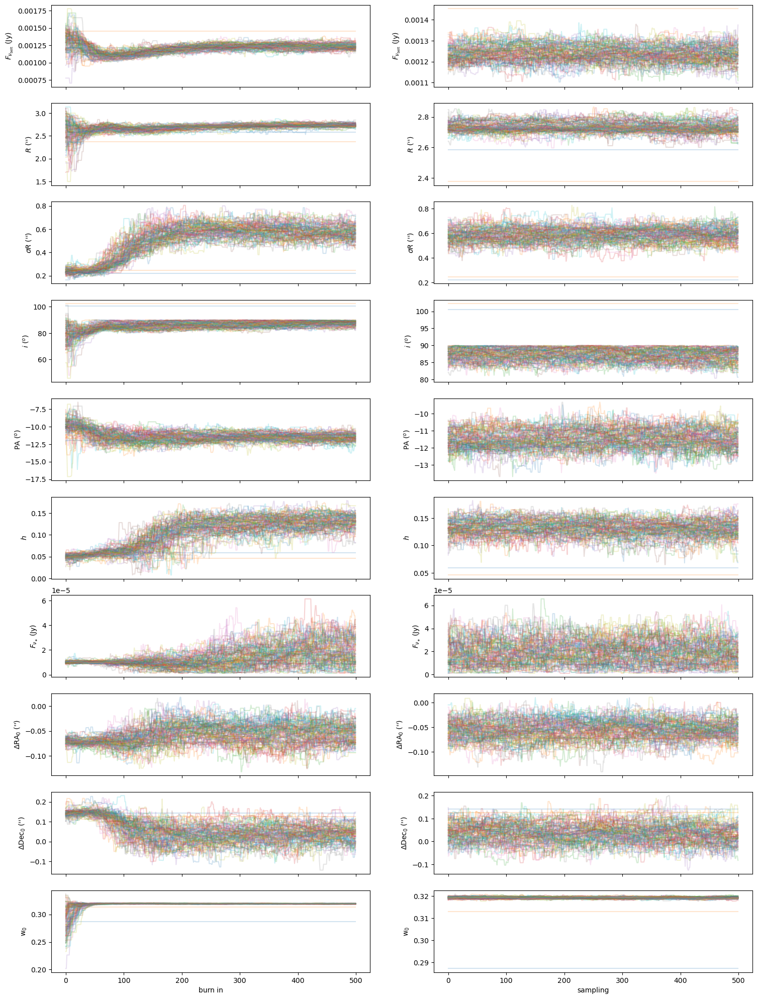

In [12]:
newbackend=False
backendaddress='backend_'+sourcetag+'_todaysdate_computersname_v4.pkl'
pickle.dump([newbackend, backendaddress], open('backendoptions.npy', 'wb'), protocol=2)
%run setup_mcmc
chain=backend.get_chain()
print(chain.shape)
burnin=500

if burnin>=chain.shape[0]:
    import sys
    sys.exit('ERROR: burn-in phase longer than number of steps computed! Reset to smaller value')
    
fig,ax = pl.subplots(ndim,2,figsize=(18,25),sharex='col',sharey=False)
for j in range(chain.shape[1]):
    #ax[-1,0].plot(sampler.lnprobability[j,:burn])
    for i in range(chain.shape[2]):
        ax[i,0].plot(chain[:burnin,j,i], alpha=0.2)
        ax[i,0].set_ylabel(labelparams[i])

for j in range(chain.shape[1]):
    #ax[-1,1].plot(sampler.lnprobability[j,burn:])
    for i in range(chain.shape[2]):
        ax[i,1].plot(chain[burnin:,j,i], alpha=0.2)
        ax[i,1].set_ylabel(labelparams[i])

ax[-1,0].set_xlabel('burn in')
ax[-1,1].set_xlabel('sampling')
#fig.savefig(traceplotname+'.pdf')
#pl.close()
#os.system('cp -r '+traceplotname+'.pdf ../plots/.')


If chains look converged for every parameter (you can also use more formal convergence criteria - see e.g. emcee 
documentation), you can be happy and proceed to the next notebook describing postprocessing (Step 3). <br>
If you're not happy, run for longer using:

In [ ]:
## If number of steps is insufficient, i.e. if the chains have not converged for each parameter, run for more steps using:
#newbackend=False
#backendaddress='backend_'+sourcetag+'_todaysdate_computersname_v2.pkl'
#pickle.dump([newbackend, backendaddress], open('backendoptions.npy', 'wb'), protocol=2)
#%run setup_mcmc
#nsteps=1000-chain.shape[0] #chain.shape[0] contains the number of steps we have currently run for, and nsteps will be
## the number of steps you want to go further by.
#sampler.run_mcmc(None,nsteps,progress=True)